# **Lab 2.1 Image Enhancement with Math Operation**
This lab consists of two main subparts: Image Pixel Adjustment using Linear Equations and Gamma Equations.

In [148]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1 import ImageGrid
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

Read an image using OpenCV (Use your own image).

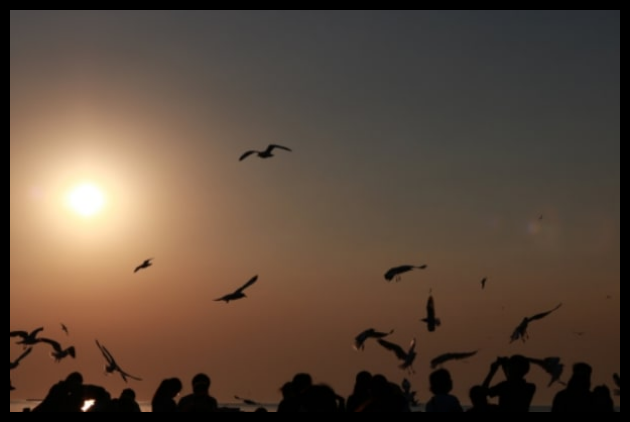

In [149]:
### START CODE HERE ###
cv_img = cv2.imread("./assets/sky.jpg")
rgb_img = cv2.cvtColor(cv_img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for display
plt.style.use('dark_background')

plt.imshow(rgb_img, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()
### END CODE HERE ###

## **Image Pixel Adjustment**

### Using Linear Equation
$$I_{new} = I \cdot a + b$$

Please perform at ***least 20 iterations*** with varying values of $a$ and $b$.
Assign the result of each iteration to an array.<br/>

In [150]:
### START CODE HERE ###
a = 0
b = 0
lin_result = []

for step in range(40) :
    new_I = (rgb_img * a) + b  # a = * contrast -> a น้อย : low contrast / a มาก : high contrast ภาพชัด, b = + brightness 
    new_I = np.clip(new_I, 0, 255).astype(np.uint8)  # Ensure values are within valid range
    lin_result.append(new_I)
    a = a + 0.09
    b = b + 2.5

print(lin_result)

### END CODE HERE ###

[array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], shape=(399, 605, 3), dtype=uint8), array([[[ 9,  9,  9],
        [ 9,  9,  9],
        [ 9,  9,  9],
        ...,
        [ 6,  6,  6],
        [ 6,  6,  6],
        [ 6,  6,  6]],

       [[ 9,  9,  9],
        

Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical
- The reference output used 40 iterations.

![image-2.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/1-1.png?raw=true)
</details>


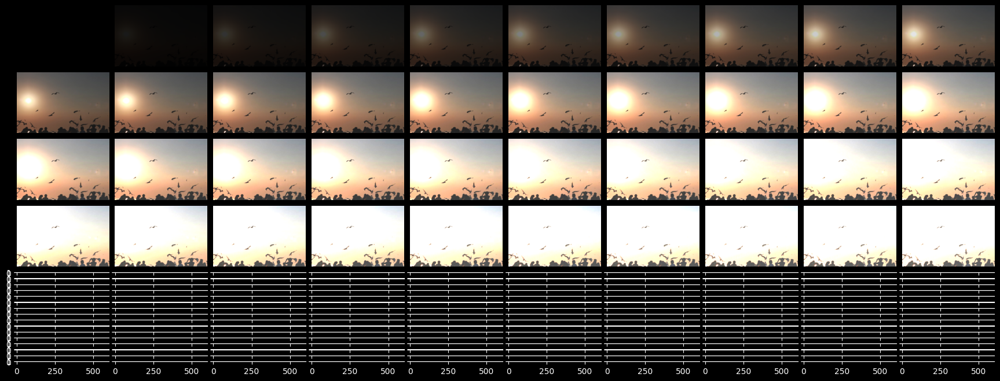

In [151]:
### START CODE HERE ###

fig = plt.figure(figsize=(25, 8))

#                                  จำนวน  จำนวน  ลำดับของ subplot ที่เลือก
#                     grid subplot(nrows, ncols, index)
grid = ImageGrid(fig, 111, nrows_ncols=(20, 10), axes_pad=0.1) # create a grid

for ax, img in zip(grid, lin_result): # use zip to match ax and img
    ax.imshow(img, cmap='gray')
    ax.axis('off')
    
plt.show()
### END CODE HERE ###

If you code work properly, the cell below should run without error.

In [152]:
assert len(lin_result) >= 20, f"Expected more than or equal 20 iterations but got {len(lin_result)}"
for idx, result in enumerate(lin_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Save the array of images to a video. Please complete the function below.

In [153]:
def write_images_to_video(image_array, output_file, frame_rate=30):

    height, width, channel = image_array[0].shape

    # codec
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')

    # create VideoWriter object
    out = cv2.VideoWriter(output_file, fourcc, frame_rate, (width, height))

    for img in image_array:
        out.write(img.astype(np.uint8))

    out.release()

Use `write_images_to_video()` and save the result.

In [154]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_linear.mp4")
write_images_to_video(lin_result,output_file)

Now use `matplotlib.animation` to display the animation from the images array.

In [155]:
%%capture
### START CODE HERE ###
fig, ax = plt.subplots()
ax.axis("off")

frames_artists = []
for frame in lin_result :
    im = ax.imshow(frame, animated=True)
    frames_artists.append([im])

ani = animation.ArtistAnimation(fig, frames_artists, interval=100, blit=True, repeat_delay=1000)

### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![linear.gif](![<attachment:linear (2).gif>](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/linear.gif?raw=true))

</details>

In [156]:
display(HTML(ani.to_jshtml()))

### Gamma Equation
$$I_{new} = I^{\gamma} \cdot a + b$$

Where $a$ is 1 and $b$ is 0. 
Please perform ***at least 10 iterations*** for 0 < $\gamma$ < 1 and another ***at least 10 iterations*** for $\gamma$ > 1
Assign the result of each iteration to an array.<br/>


### ต้อง norm ก่อน

ตัวอย่าง :
พิกเซล 100 -> 100 ^ 0.1 จะได้ประมาณ 1.58 ซึ่งเป็นค่าที่ต่ำมาก -> ภาพที่ได้จะมาออกมาดำ
ถ้า 0-255 ^ 0.1 ค่าจะประมาณ 1-2

- ต้อง norm ก่อนแล้ว scale กลับมา
- non-linear mapping ของความสว่าง

In [157]:
### START CODE HERE ###
a = 1
b = 0

norm_img = (rgb_img - rgb_img.min()) / (rgb_img.max() - rgb_img.min())  # Normalize the image to [0, 1]

gam_result = []

for gamma in np.arange(0.1, 2.1, 0.1):
    new_I = ((norm_img ** gamma) * a) + b
    new_I = (new_I * 255).astype(np.uint8)  # Scale back to [0, 255]
    gam_result.append(new_I)
    print(gamma)

### END CODE HERE ###

0.1
0.2
0.30000000000000004
0.4
0.5
0.6
0.7000000000000001
0.8
0.9
1.0
1.1
1.2000000000000002
1.3000000000000003
1.4000000000000001
1.5000000000000002
1.6
1.7000000000000002
1.8000000000000003
1.9000000000000001
2.0


Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image-2.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/1-2.png?raw=true)
</details>

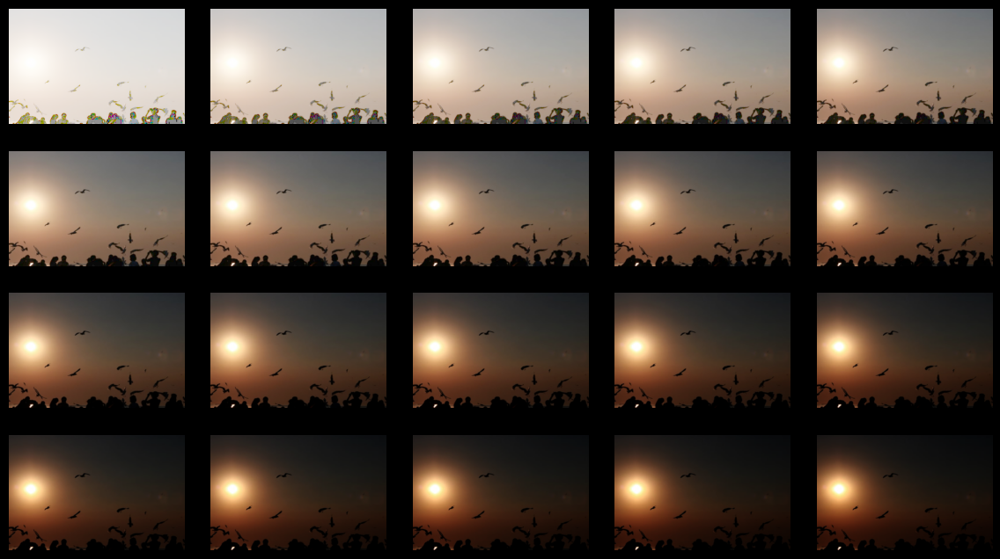

In [158]:
### START CODE HERE ###

fig = plt.figure(figsize=(25, 8))

#                     grid subplot
grid = ImageGrid(fig, 111, nrows_ncols=(4, 5), axes_pad=0.3) # create a grid

for ax, img in zip(grid, gam_result): # use zip to match ax and img
    ax.imshow(img, cmap='gray')
    ax.axis('off')
    
plt.show()
### END CODE HERE ###

In [159]:
assert len(gam_result) >= 20, f"more than or equal 20 iterations but got {len(gam_result)}"
for idx, result in enumerate(gam_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Use `write_images_to_video()` and save the result.

In [160]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_gamma.mp4")
write_images_to_video(gam_result,output_file)

Now use `matplotlib.animation` to display the animation from the images array.

In [161]:
%%capture
### START CODE HERE ###

fig, ax = plt.subplots()
ax.axis("off")

frames_artists = []
for frame in gam_result :
    im = ax.imshow(frame, animated=True)
    frames_artists.append([im])

ani = animation.ArtistAnimation(fig, frames_artists, interval=100, blit=True, repeat_delay=1000)

### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![gamma2.gif](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/gamma.gif?raw=true)

</details>

In [162]:
display(HTML(ani.to_jshtml()))

---

## **Questions**
1. If an image having over brightness or saturation, what would be possible solutions to enhance the image.
2. How can we make an image reverse intensity (black-to-white, white-to-black)? Explain the process   

## **Answer**
1. ในกรณีสว่างมากเกินไป ใช้ linear operation ในการแต่งภาพ โดยที่กำหนดให้ b เป็นค่าติดลบ ยิ่งติดลบมาก ยิ่งได้ภาพที่มีความมืดมากขึ้น
ในกรณีอิ่มตัวมากเกินไป ใช้ gamma operation โดยที่กำหนดให้ค่าของ gamma อยู่ในช่วง (0,1) จะได้ภาพผลลัพธ์ที่มีความอิ่มตัวน้อยลง
2. ปรับภาพให้เป็น grayscale ก่อน จากนั้นใช้ linear operation ในการแต่งภาพ โดยการให้ parameter b มีค่าเท่ากับ -255 โดยที่ไม่ต้อง clip(0, 255) จะเป็นการลบค่ามากที่สุดออกจากภาพ ภาพที่ออกมาจะได้ภาพที่กลับสีกัน จากขาวเป็นดำ จากดำเป็นขาว

## **Prove Q.2**

In [163]:
### START CODE HERE ###
a = 0
b = 0
lin_result = []

for step in range(200) :
    new_I = (cv2.cvtColor(rgb_img, cv2.COLOR_RGB2GRAY) * a) + b  # a = * contrast -> a น้อย : low contrast / a มาก : high contrast ภาพชัด, b = + brightness 
    new_I = new_I.astype(np.uint8)  # Ensure values are within valid range
    lin_result.append(new_I)
    a = a + 0.09
    b = b - 5

print(lin_result)

### END CODE HERE ###

[array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(399, 605), dtype=uint8), array([[  1,   1,   1, ..., 255, 255, 255],
       [  1,   1,   1, ..., 255, 255, 255],
       [  1,   1,   1, ..., 255, 255, 255],
       ...,
       [  4,   4,   4, ..., 254, 254, 254],
       [  4,   4,   4, ..., 254, 254, 254],
       [  4,   4,   4, ..., 254, 254, 254]], shape=(399, 605), dtype=uint8), array([[  3,   3,   3, ..., 254, 254, 254],
       [  3,   3,   3, ..., 254, 254, 254],
       [  3,   3,   3, ..., 254, 254, 254],
       ...,
       [  8,   8,   8, ..., 252, 252, 252],
       [  8,   8,   8, ..., 252, 252, 252],
       [  8,   8,   8, ..., 251, 252, 252]], shape=(399, 605), dtype=uint8), array([[  5,   5,   5, ..., 253, 253, 253],
       [  5,   5,   5, ..., 253, 253, 253],
       [  5,   5,   5, ..., 253, 253, 253],
       ...,
